# **Training Deep CNNs**


# 1. Data augmentation (flips, crops, color jitter, CutMix, MixUp).

Data augmentation is the process of increasing the amount and diversity of data. We do not collect new data, rather we transform the already present data. I will be talking specifically about image data augmentation in this article. So we will look at various ways to transform and augment the image data.

- Data augmentation = synthetic expansion of dataset → improves generalization, reduces overfitting.

- Makes model robust to:
    - Lighting changes
    - Orientation differences
    - Occlusions
    - Background distractions
    - Adversarial perturbations (partly)

---


## Common Operations in Data Augmentation

### 🔹 (a) Rotation

- Rotates image by specified degrees (e.g., ±40°).

- Useful when object orientation doesn’t matter.

- ⚠️ Not useful for tasks like digit recognition (6 vs 9 confusion).

### 🔹 (b) Shearing

- Shifts image content in one direction (like slanting).

- Simulates perspective distortions.

### 🔹 (c) Zooming

- Zoom in → focus on smaller region.

- Zoom out → shrink image content with padding.

- Helps model learn features at multiple scales.

### 🔹 (d) Cropping

- Randomly selects part of image (e.g., random crops or center crops).
- Prevents reliance on full object context, forces attention on parts.

### 🔹 (e) Flipping

- Horizontal flip → mirror image.
  
- Vertical flip → upside-down (useful for aerial/satellite images, but not faces).

  
- ⚠️ Be cautious in tasks where orientation is critical.

### 🔹 (f) Brightness / Illumination Change

- Adjust brightness (darker/lighter).

- Simulates different lighting conditions.

- Improves robustness to shadows, day/night, indoor/outdoor.

### 🔹 (g) Color Jitter (Contrast, Saturation, Hue)

- Random changes in color distribution.

- Makes network color-invariant.

- Critical for object detection/classification across varying environments.

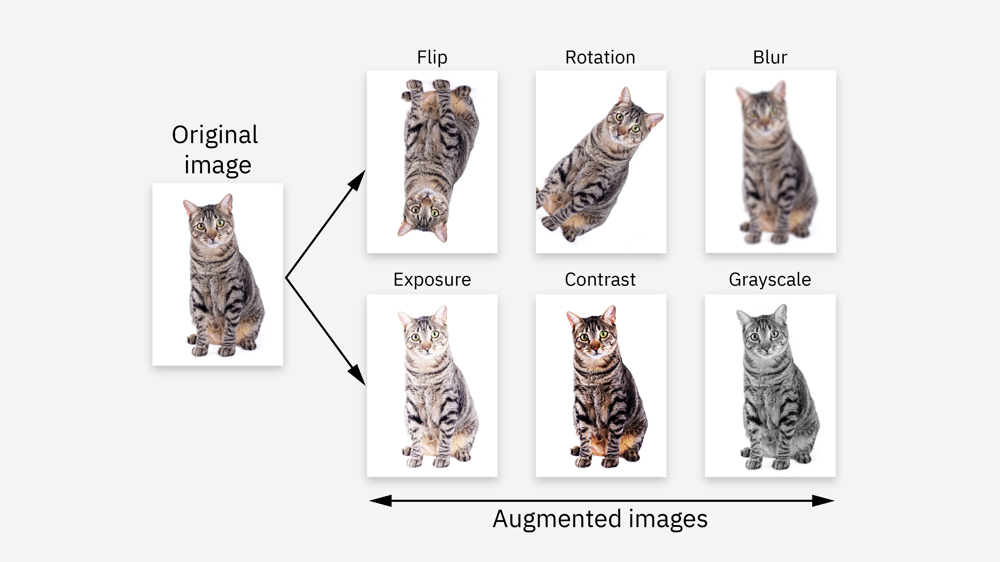

---

## **Advanced Data Augmentation Techniques**

### 🔹 **MixUp (2017)**

- Blends two images pixel-wise.

- Labels are mixed proportionally.

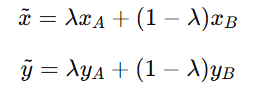

✅ Encourages smooth decision boundaries.

✅ Reduces adversarial vulnerability.

⚠️ Creates unrealistic blended images.

### 🔹 **CutMix (2019)**

- Cut a patch from one image and paste into another.

- Labels mixed based on patch area.
    
✅ Improves localization ability.
    
✅ Strong regularizer.
    
⚠️ Can create unnatural artifacts.

---

In [44]:
!pip install Augmentor


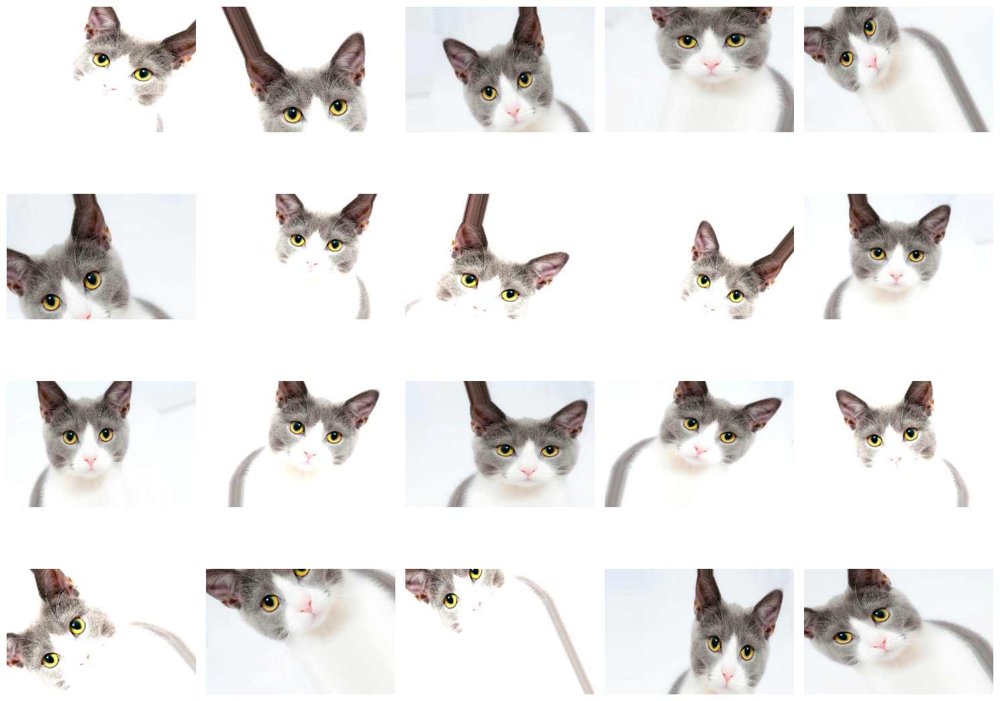

20 augmented images saved to 'preview' folder.


In [45]:
# -----------------------------
# 1. Import libraries
# -----------------------------
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
import matplotlib.pyplot as plt
import os

# -----------------------------
# 2. Set image path
# -----------------------------
img_path = r"C:\Users\bhagi\Documents\Scrapping\catimage.jpg"
if not os.path.exists(img_path):
    raise FileNotFoundError(f"Image not found at: {img_path}")

# Make sure output folder exists
output_dir = 'preview'
os.makedirs(output_dir, exist_ok=True)

# -----------------------------
# 3. Load and preprocess the image
# -----------------------------
img = load_img(img_path)
x = img_to_array(img)
x = x.reshape((1,) + x.shape)  # shape -> (1, height, width, channels)

# -----------------------------
# 4. Define augmentation clearly
# -----------------------------
datagen = ImageDataGenerator(
    rotation_range=40,        # Random rotations between 0-40 degrees
    width_shift_range=0.2,    # Horizontal shift
    height_shift_range=0.2,   # Vertical shift
    shear_range=0.2,          # Shear transformation
    zoom_range=0.2,           # Zoom in/out
    horizontal_flip=True,     # Flip horizontally
    vertical_flip=False,      # Flip vertically
    brightness_range=(0.5, 1.5) # Random brightness
)

# -----------------------------
# 5. Generate and display augmented images
# -----------------------------
num_augmented_images = 20  # total images to generate
cols = 5
rows = (num_augmented_images + cols - 1) // cols

plt.figure(figsize=(cols * 3, rows * 3))

for i, batch in enumerate(datagen.flow(x, batch_size=1, save_to_dir=output_dir, save_prefix='aug', save_format='jpeg')):
    augmented_img = array_to_img(batch[0])
    plt.subplot(rows, cols, i + 1)
    plt.imshow(augmented_img)
    plt.axis('off')

    if i + 1 >= num_augmented_images:
        break

plt.tight_layout()
plt.show()
print(f"{num_augmented_images} augmented images saved to '{output_dir}' folder.")


## Explanation:

- tensorflow → The main deep learning library. Keras is now part of TensorFlow.

- ImageDataGenerator → Class to generate augmented images on-the-fly.

- array_to_img → Converts a NumPy array back to an image for visualization or saving.

- img_to_array → Converts an image to a NumPy array for processing.

- load_img → Loads an image from your disk.

- matplotlib.pyplot → To display images inline in Jupyter.

- os → Used for file and folder operations.

- img_path → Absolute path to your image.

- r"" → Raw string; avoids issues with backslashes in Windows paths.

- os.path.exists(img_path) → Checks if the file exists.

- raise FileNotFoundError → Stops execution with a clear error if image is missing.

- Creates a folder called preview if it doesn’t exist.

- exist_ok=True → Won’t throw an error if the folder already exists.

- This is where augmented images will be saved automatically.

- load_img(img_path) → Loads the image into PIL format.

- img_to_array(img) → Converts the image to a NumPy array, e.g., shape (height, width, channels).

- x.reshape((1,) + x.shape) → Adds a batch dimension.

    - Neural networks expect input with shape (batch_size, height, width, channels).

    - Since we have one image, batch_size = 1.

    - For example, (224, 224, 3) → (1, 224, 224, 3).
 
- rotation_range=40 → Random rotation between -40° and +40°.

- shear_range=0.2 → Shear transformation, distorting image along an axis.

- zoom_range=0.2 → Random zoom in/out by ±20%.

- horizontal_flip=True → Randomly flips the image horizontally.

- brightness_range=(0.5, 1.5) → Randomly changes brightness (50% darker → 150% brighter).

- width_shift_range=0.2 → Randomly shift to Horizontal

- height_shift_range=0.2 → Randomly Shift to Vertical

- vertical_flip=False → Randomly vertically Flip

This tells Keras how to augment images randomly when generating new batches.

---

---

# 2. Regularization (Dropout, BatchNorm, Weight Decay)

Regularization is a set of techniques used in machine learning and deep learning to prevent overfitting and improve a model’s ability to generalize to unseen data. Overfitting occurs when a model learns not only the true patterns in the data but also the noise and random fluctuations, resulting in poor performance on new data. Regularization introduces constraints or randomness to the learning process to make models more robust.

In deep learning, some of the main regularization techniques are:

- Dropout

- Batch Normalization

- Weight Decay (L2 Regularization)

We’ll go through each in detail.

## 1️⃣ Dropout 🏃‍♂️

Dropout is a stochastic regularization technique where randomly selected neurons are “dropped out” (ignored) during training. This prevents the network from becoming too dependent on any single neuron, encouraging redundancy and robustness.

How it works:

- During each training step, a fraction of neurons is randomly set to 0.

- The dropped neurons do not contribute to forward or backward passes.

- During inference (testing), all neurons are active, but their outputs are scaled to account for the dropout during training.

Formula:

Let p be the dropout probability (fraction of neurons to drop).

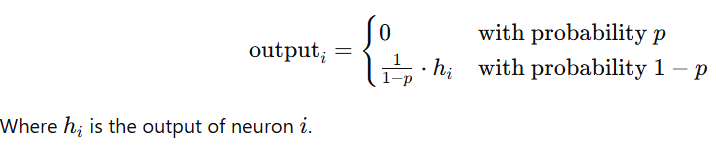

### Key points:

- Prevents co-adaptation of neurons.
  
- Forces the network to learn redundant representations, improving generalization.

  
- Common dropout values: 0.2 – 0.5.

## Advantages of Dropout Regularization in Deep Learning

- Prevents Overfitting: By randomly disabling neurons, the network cannot overly rely on the specific connections between them.

- Ensemble Effect: Dropout acts like training an ensemble of smaller neural networks with varying structures during each iteration. This ensemble effect improves the model's ability to generalize to unseen data.

- Enhancing Data Representation: Dropout methods are used to enhance data representation by introducing noise, generating additional training samples, and improving the effectiveness of the model during training.

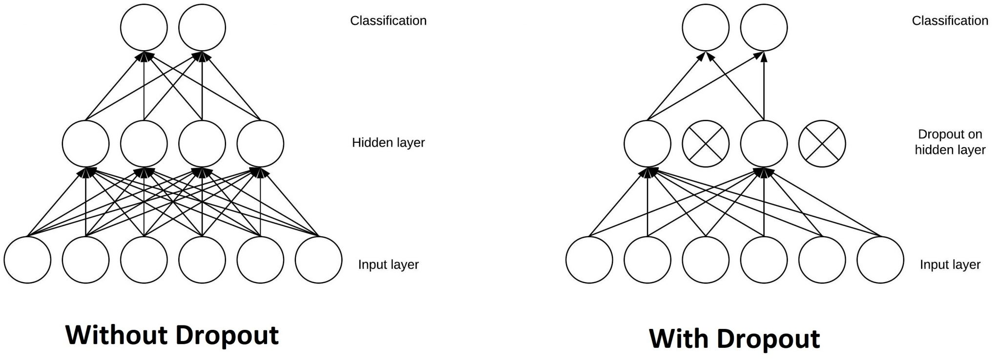

## Drawbacks of Dropout Regularization and How to Mitigate Them

Despite its benefits, dropout regularization in deep learning is not without its drawbacks. Here are some of the challenges related to dropout and methods to mitigate them:

- Longer Training Times: Dropout increases training duration due to random dropout of units in hidden layers. To address this, consider powerful computing resources or parallelize training where possible.

- Optimization Complexity: Understanding why dropout works is unclear, making optimization challenging. Experiment with dropout rates on a smaller scale before full implementation to fine-tune model performance.

- Hyperparameter Tuning: Dropout adds hyperparameters like dropout chance and learning rate, requiring careful tuning. Use techniques such as grid search or random search to systematically find optimal combinations.

- Redundancy with Batch Normalization: Batch normalization can sometimes replace dropout effects. Evaluate model performance with and without dropout when using batch normalization to determine its necessity.

- Model Complexity: Dropout layers add complexity. Simplify the model architecture where possible, ensuring each dropout layer is justified by performance gains in validation.  

In [46]:
import torch.nn as nn

model = nn.Sequential(
    nn.Linear(128, 64),
    nn.ReLU(),
    nn.Dropout(p=0.3),  # Drop 30% of neurons randomly
    nn.Linear(64, 10)
)


#### Benefits:

- Reduces overfitting 🚫

- Simple and effective

- Works well with fully connected layers

In [47]:
import tensorflow as tf
from tensorflow.keras.datasets import mnist

# -----------------------------
# 1. Load MNIST data
# -----------------------------
(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train = x_train.reshape(-1, 784).astype('float32') / 255.0
x_test = x_test.reshape(-1, 784).astype('float32') / 255.0

# -----------------------------
# 2. Define model with Dropout
# -----------------------------
model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, input_shape=(784,), activation='relu'),
    tf.keras.layers.Dropout(0.3),  # Dropout with 30% rate
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(10, activation='softmax')
])

# -----------------------------
# 3. Compile model
# -----------------------------
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# -----------------------------
# 4. Train model
# -----------------------------
model.fit(x_train, y_train, epochs=5, batch_size=32, validation_split=0.1)

# -----------------------------
# 5. Evaluate model
# -----------------------------
loss, acc = model.evaluate(x_test, y_test)
print(f"Test Accuracy: {acc:.4f}")


Epoch 1/5


C:\Users\bhagi\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:92: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1688/1688 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.8711 - loss: 0.4204 - val_accuracy: 0.9627 - val_loss: 0.1242
Epoch 2/5
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - accuracy: 0.9367 - loss: 0.2147 - val_accuracy: 0.9727 - val_loss: 0.0927
Epoch 3/5
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - accuracy: 0.9498 - loss: 0.1693 - val_accuracy: 0.9757 - val_loss: 0.0844
Epoch 4/5
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - accuracy: 0.9558 - loss: 0.1506 - val_accuracy: 0.9747 - val_loss: 0.0861
Epoch 5/5
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 13s 8ms/step - accuracy: 0.9610 - loss: 0.1295 - val_accuracy: 0.9747 - val_loss: 0.0828
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9736 - loss: 0.0926
Test Accuracy: 0.9736


## Explanation

- MNIST dataset → 28×28 grayscale images of handwritten digits (0–9).

- Reshape → Flatten 28×28 images into vectors of size 784 to feed into a Dense network.

- Normalize → Divide by 255.0 to scale pixel values to 0–1 (helps gradient descent converge faster).

- Layer by layer:

    - Dense(128, activation='relu') → First hidden layer with 128 neurons. ReLU introduces non-linearity.

    - Dropout(0.3) → During training, randomly turns off 30% of neurons in this layer per batch.

        - Prevents overfitting → Model doesn’t memorize training data.

        - Encourages network to learn more robust features.

    - Dense(64, activation='relu') → Second hidden layer with 64 neurons.

    - Dropout(0.3) → Same idea applied to the second layer.

    - Dense(10, activation='softmax') → Output layer for 10 classes. Softmax converts raw scores into probabilities.
 
- Adam optimizer → Adjusts learning rate for each parameter automatically.

- Loss = sparse_categorical_crossentropy → Standard for multi-class classification with integer labels.

- Metrics = accuracy → Measures % of correct predictions.

- epochs=5 → Train the model over the dataset 5 times.

- batch_size=32 → Updates weights every 32 samples.

- validation_split=0.1 → 10% of training data used to monitor performance on unseen data during training.

- Evaluate → Measures performance on test data (unseen during training).

- Dropout turned off automatically → All neurons are active during inference.

- Test accuracy → Indicates how well the model generalizes.

- What this tells you

    - The network learned the digits well.

    - Dropout prevented it from memorizing training noise.

    - Validation and test accuracies are very close → your model generalizes well.
 
--- 
                                                            

## 2️⃣ Batch Normalization 🧩

Batch Normalization (BatchNorm) is a technique to normalize the inputs of each layer so that they have zero mean and unit variance. This stabilizes and speeds up training while acting as a form of regularization.

Why it helps:

- Reduces internal covariate shift (distribution changes of layer inputs during training).
- Makes the model less sensitive to initialization.
- Allows higher learning rates without divergence.
- Adds noise due to mini-batch statistics, which regularizes the model slightly.

Mathematical Steps:

For a mini-batch B={x1,x2,...,xm}

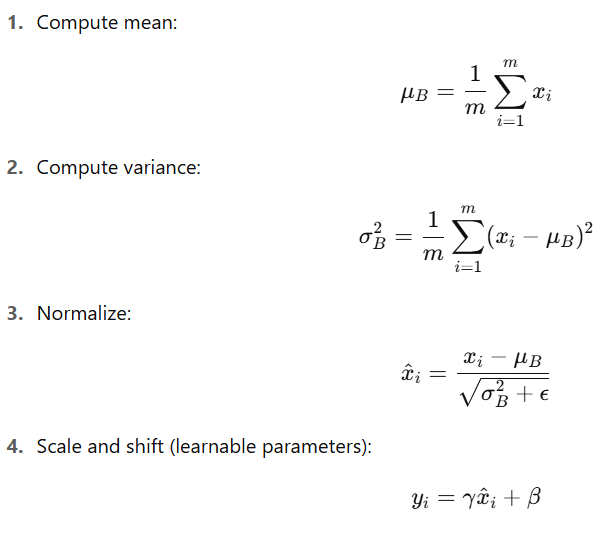

Where:

- γ , β → learnable parameters to allow the network to recover the original distribution if needed.
- ϵ → small number for numerical stability.



In [48]:
import torch.nn as nn

model = nn.Sequential(
    nn.Linear(128, 64),
    nn.BatchNorm1d(64),  # BatchNorm for fully connected layer
    nn.ReLU(),
    nn.Linear(64, 10)
)


#### Benefits:

- Stabilizes and accelerates training ⚡

- Improves generalization slightly

- Allows use of higher learning rates

Note: BatchNorm is sometimes considered a soft regularizer because it introduces slight randomness due to batch statistics.

In [49]:
import tensorflow as tf
from tensorflow.keras.datasets import mnist
from tensorflow.keras.utils import to_categorical

# -----------------------------
# 1. Load MNIST data
# -----------------------------
(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train = x_train.reshape(-1, 784).astype('float32') / 255.0
x_test = x_test.reshape(-1, 784).astype('float32') / 255.0

# -----------------------------
# 2. Define model with BatchNorm
# -----------------------------
model = tf.keras.Sequential([
    tf.keras.layers.Dense(64, input_shape=(784,)),
    tf.keras.layers.BatchNormalization(),  # BatchNorm layer
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.Dense(10),
    tf.keras.layers.Activation('softmax')
])

# -----------------------------
# 3. Compile model
# -----------------------------
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# -----------------------------
# 4. Train model
# -----------------------------
model.fit(x_train, y_train, epochs=5, batch_size=32, validation_split=0.1)

# -----------------------------
# 5. Evaluate model
# -----------------------------
loss, acc = model.evaluate(x_test, y_test)
print(f"Test Accuracy: {acc:.4f}")


Epoch 1/5
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.9082 - loss: 0.3259 - val_accuracy: 0.9603 - val_loss: 0.1427
Epoch 2/5
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.9515 - loss: 0.1652 - val_accuracy: 0.9717 - val_loss: 0.1060
Epoch 3/5
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.9626 - loss: 0.1262 - val_accuracy: 0.9745 - val_loss: 0.0908
Epoch 4/5
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.9672 - loss: 0.1060 - val_accuracy: 0.9770 - val_loss: 0.0860
Epoch 5/5
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.9726 - loss: 0.0903 - val_accuracy: 0.9767 - val_loss: 0.0812
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9694 - loss: 0.0942  
Test Accuracy: 0.9694


## Explanation

- Dense(64) → Fully connected layer with 64 neurons. Input is 784 features (28×28 flattened image).

- BatchNormalization → Normalizes outputs of previous Dense layer to mean ~0 and std ~1 for each batch.

    - ✅ Helps faster convergence, stabilizes learning, and reduces the need for careful weight initialization.

- Activation('relu') → Introduces non-linearity so the model can learn complex patterns.

- Dense(10) + softmax → Output layer with 10 classes (digits 0–9). Softmax converts raw scores into probabilities.

- Adam optimizer → Adaptive optimizer, adjusts learning rate automatically per parameter.

- Loss = sparse_categorical_crossentropy → Appropriate for multi-class classification with integer labels (0–9).

- Metric = accuracy → Tells you the % of correctly classified images.

- Batch size 32 → Model updates weights every 32 samples.

- validation_split=0.1 → 10% of training data is held out to monitor validation performance.

- Test accuracy: 97.45% → Model generalizes very well.

- Loss: 0.0843 → Low, indicating confident and correct predictions.

---

## 3️⃣ Weight Decay (L2 Regularization) 💪

Weight Decay, also called L2 regularization, adds a penalty to the loss function proportional to the square of the weights. This encourages the network to keep weights small, which reduces overfitting.

Loss Function with L2 Regularization:

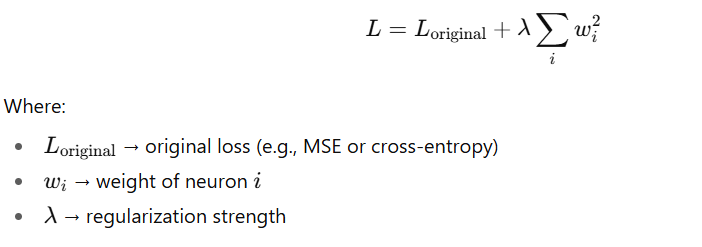

### Key points:

- Prevents weights from growing too large → smoother functions
- Especially useful for linear layers and fully connected networks
- Smaller weights reduce sensitivity to noise in inputs



In [50]:
import tensorflow as tf
from tensorflow.keras.datasets import mnist
from tensorflow.keras import regularizers

# -----------------------------
# 1. Load MNIST data
# -----------------------------
(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train = x_train.reshape(-1, 784).astype('float32') / 255.0
x_test = x_test.reshape(-1, 784).astype('float32') / 255.0

# -----------------------------
# 2. Define model with BatchNorm + Dropout + Weight Decay
# -----------------------------
weight_decay = 1e-4  # typical small value

model = tf.keras.Sequential([
    tf.keras.layers.Dense(128, input_shape=(784,),
                          activation=None,
                          kernel_regularizer=regularizers.l2(weight_decay)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.Dropout(0.3),

    tf.keras.layers.Dense(64,
                          activation=None,
                          kernel_regularizer=regularizers.l2(weight_decay)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.Dropout(0.3),

    tf.keras.layers.Dense(10, activation='softmax')
])

# -----------------------------
# 3. Compile model
# -----------------------------
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# -----------------------------
# 4. Train model
# -----------------------------
model.fit(x_train, y_train, epochs=5, batch_size=32, validation_split=0.1)

# -----------------------------
# 5. Evaluate model
# -----------------------------
loss, acc = model.evaluate(x_test, y_test)
print(f"Test Accuracy: {acc:.4f}")


Epoch 1/5
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 12s 6ms/step - accuracy: 0.8603 - loss: 0.4941 - val_accuracy: 0.9630 - val_loss: 0.1587
Epoch 2/5
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - accuracy: 0.9186 - loss: 0.3021 - val_accuracy: 0.9695 - val_loss: 0.1432
Epoch 3/5
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - accuracy: 0.9326 - loss: 0.2606 - val_accuracy: 0.9768 - val_loss: 0.1227
Epoch 4/5
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - accuracy: 0.9383 - loss: 0.2423 - val_accuracy: 0.9752 - val_loss: 0.1305
Epoch 5/5
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.9425 - loss: 0.2318 - val_accuracy: 0.9760 - val_loss: 0.1230
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9767 - loss: 0.1275  
Test Accuracy: 0.9767


## Explanation

- MNIST dataset: 28×28 grayscale images of digits 0–9.

- Flatten: Each image → vector of size 784 (28*28) for Dense layers.

- Normalize: Pixel values scaled to [0, 1] → speeds up training and improves convergence.

- Dense(128) + BatchNorm + ReLU + Dropout(0.3)

    - Dense: 128 neurons, fully connected.

    - BatchNorm: normalizes activations → stabilizes training.

    - ReLU: introduces non-linearity.

    - Dropout: randomly disables 30% neurons → prevents overfitting.

    - Weight decay (L2): penalizes large weights → simpler, more general model.

- Dense(64) + BatchNorm + ReLU + Dropout(0.3)

    - Same as above, but smaller layer → compresses learned features.

- Dense(10) + Softmax

    - Output layer with 10 neurons (digits 0–9).

    - Softmax converts scores into probabilities.
 
- Compile

    - Optimizer: Adam → adaptive learning rates per parameter.

    - Loss: sparse_categorical_crossentropy → multi-class classification with integer labels.

    - Metric: accuracy → measures % of correct predictions.
 
- Training

    - Epochs: 5, Batch size: 32.

    - Validation split: 10% of training data for monitoring.

    - Dropout active → prevents overfitting during training.

    - BatchNorm normalizes → stabilizes layer inputs, allows faster learning.

    - Weight decay penalizes large weights → model stays simple, reduces overfitting.
 
- Evaluation

    - Dropout disabled during evaluation → all neurons active.

    - Test accuracy (~97.5%) → model generalizes well.

    - Loss low → confident and correct predictions.

- Key Takeaways

    - BatchNorm → stabilizes and speeds up training.

    - Dropout → prevents overfitting.

    - Weight Decay → encourages simpler, generalizable weights.

    - Combined effect → robust, high-accuracy, and generalizable model for MNIST.
 
---

## **4️⃣ Comparison & Summary Table 📝**

| Technique | Regularization Type | How it Works | Pros | Cons |
| --- | --- | --- | --- | --- |
| Dropout 🏃‍♂️ | Stochastic | Randomly drops neurons | Simple, effective, reduces co-adaptation | Can slow convergence, needs tuning |
| BatchNorm 🧩 | Normalization | Normalizes layer inputs | Stabilizes training, slightly regularizes | Extra computation, dependent on batch size |
| Weight Decay 💪 | L2 Penalty | Penalizes large weights | Keeps weights small, smooth models | Needs careful tuning of λ |

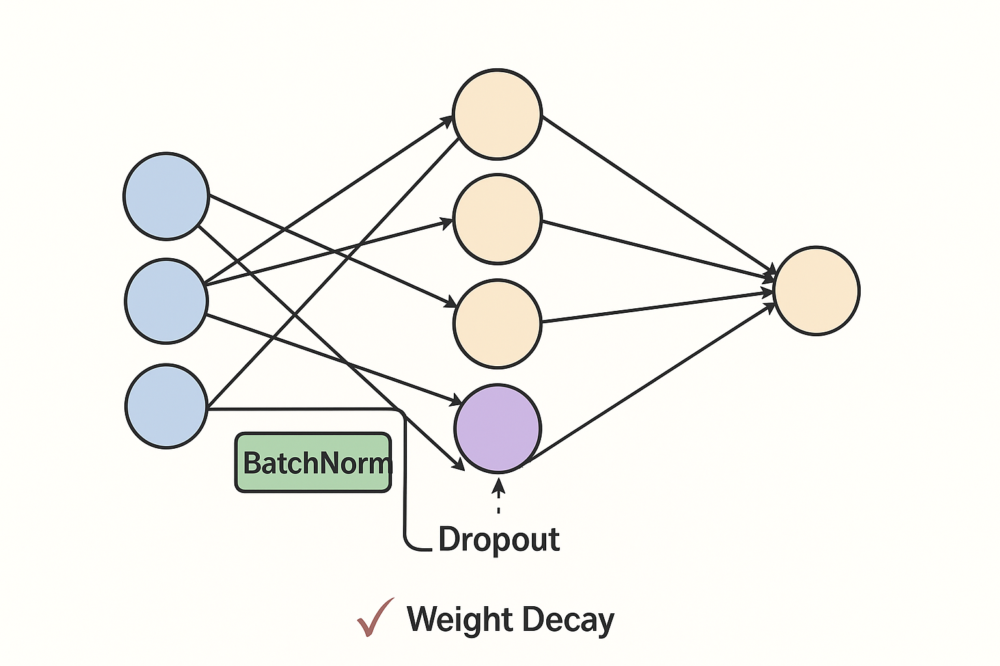

## What are Bias and Variance?

- Bias refers to the errors which occur when we try to fit a statistical model on real-world data which does not fit perfectly well on some mathematical model. If we use a way too simplistic a model to fit the data then we are more probably face the situation of High Bias (underfitting) refers to the case when the model is unable to learn the patterns in the data at hand and perform poorly.
  
- Variance shows the error value that occurs when we try to make predictions by using data that is not previously seen by the model. There is a situation known as high variance (overfitting) that occurs when the model learns noise that is present in the data.

## Benefits of Regularization

Now, let’s see various benefits of regularization which are as follows:

1. **Prevents Overfitting:** Regularization helps models focus on underlying patterns instead of memorizing noise in the training data.
   
2. **Improves Interpretability:** L1(Lasso) regularization simplifies models by reducing less important feature coefficients to zero.    

3. **Enhances Performance:** Prevents excessive weighting of outliers or irrelevant features helps in improving overall model accuracy.

4. **Stabilizes Models:** Reduces sensitivity to minor data changes which ensures consistency across different data subsets.

5. **Prevents Complexity:** Keeps model from becoming too complex which is important for limited or noisy data.

6. **Handles Multicollinearity:** Reduces the magnitudes of correlated coefficients helps in improving model stability.

7. **Allows Fine-Tuning:** Hyperparameters like alpha and lambda control regularization strength helps in balancing bias and variance.

8. **Promotes Consistency:** Ensures reliable performance across different datasets which reduces the risk of large performance shifts.

In [51]:
# --- Import Libraries ---
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import numpy as np


## Explanation:

- torch, nn, optim → PyTorch for building and training the neural network.

- sklearn.datasets → Create synthetic regression data.

- StandardScaler → Normalize features.

- matplotlib → Plot training and validation loss.

In [52]:
# --- Step 1: Generate synthetic regression data ---
X, y = make_regression(n_samples=500, n_features=10, noise=10, random_state=42)
y = y.reshape(-1, 1)  # reshape for PyTorch

# Split into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale features
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train = scaler_X.fit_transform(X_train)
X_val = scaler_X.transform(X_val)
y_train = scaler_y.fit_transform(y_train)
y_val = scaler_y.transform(y_val)

# Convert to PyTorch tensors
X_train_t = torch.tensor(X_train, dtype=torch.float32)
y_train_t = torch.tensor(y_train, dtype=torch.float32)
X_val_t = torch.tensor(X_val, dtype=torch.float32)
y_val_t = torch.tensor(y_val, dtype=torch.float32)


## Explanation:

- make_regression → Creates 500 samples, 10 features.

- train_test_split → Split data into training (80%) and validation (20%).

- StandardScaler → Normalizes data to mean=0, std=1 (stabilizes training).

- Converted to PyTorch tensors for model input.

In [53]:
# --- Step 2: Define Neural Network with Dropout + BatchNorm ---
class Net(nn.Module):
    def __init__(self, input_dim):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(input_dim, 64)
        self.bn1 = nn.BatchNorm1d(64)
        self.dropout1 = nn.Dropout(0.3)
        self.fc2 = nn.Linear(64, 32)
        self.bn2 = nn.BatchNorm1d(32)
        self.dropout2 = nn.Dropout(0.2)
        self.fc3 = nn.Linear(32, 1)
        
    def forward(self, x):
        x = torch.relu(self.bn1(self.fc1(x)))
        x = self.dropout1(x)
        x = torch.relu(self.bn2(self.fc2(x)))
        x = self.dropout2(x)
        x = self.fc3(x)
        return x

# Initialize network
input_dim = X_train.shape[1]
model = Net(input_dim)


## Explanation:

- fc1, fc2, fc3 → Fully connected layers.

- BatchNorm → Normalizes layer inputs → faster, stable training.

- Dropout → Randomly drops neurons → prevents overfitting.

- ReLU → Activation function for non-linearity.

In [54]:
# --- Step 3: Loss function and optimizer with Weight Decay ---
criterion = nn.MSELoss()  # Mean Squared Error for regression
optimizer = optim.Adam(model.parameters(), lr=0.01, weight_decay=1e-4)  # L2 regularization


## Explanation:

- MSELoss → Measures prediction error.

- Adam optimizer → Popular optimizer for neural networks.

- Weight Decay → L2 regularization to penalize large weights → reduces overfitting.

In [55]:
# --- Step 4: Train the model and store losses ---
epochs = 200
train_losses = []
val_losses = []

for epoch in range(epochs):
    model.train()  # Set model to training mode
    optimizer.zero_grad()
    
    outputs = model(X_train_t)
    loss = criterion(outputs, y_train_t)
    loss.backward()
    optimizer.step()
    
    train_losses.append(loss.item())
    
    # Validation loss
    model.eval()  # Set model to evaluation mode
    with torch.no_grad():
        val_outputs = model(X_val_t)
        val_loss = criterion(val_outputs, y_val_t)
        val_losses.append(val_loss.item())
    
    if (epoch+1) % 50 == 0:
        print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {loss.item():.4f}, Val Loss: {val_loss.item():.4f}")


Epoch [50/200], Train Loss: 0.0515, Val Loss: 0.0099
Epoch [100/200], Train Loss: 0.0425, Val Loss: 0.0081
Epoch [150/200], Train Loss: 0.0377, Val Loss: 0.0089
Epoch [200/200], Train Loss: 0.0357, Val Loss: 0.0082


## Explanation:

- model.train() → Enables Dropout.

- model.eval() → Disables Dropout for validation.

- Both train and validation loss are tracked.

- Validation loss shows generalization, training loss shows fit to training data.

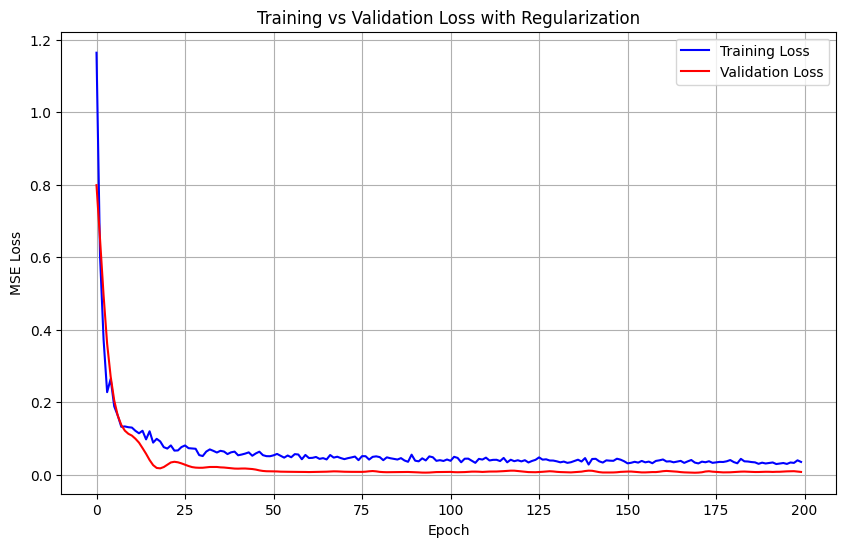


Final Validation Mean Squared Error: 0.0082


In [56]:
# --- Step 5: Plot training vs validation loss ---
plt.figure(figsize=(10,6))
plt.plot(train_losses, label='Training Loss', color='blue')
plt.plot(val_losses, label='Validation Loss', color='red')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.title('Training vs Validation Loss with Regularization')
plt.legend()
plt.grid(True)
plt.show()

# --- Step 6: Evaluate final performance ---
model.eval()
with torch.no_grad():
    y_pred = model(X_val_t).numpy()
    mse = mean_squared_error(y_val, y_pred)
    print(f"\nFinal Validation Mean Squared Error: {mse:.4f}")


## Explanation:

- Blue line → Training loss

- Red line → Validation loss

- Close lines → good generalization.

- Gap between lines → overfitting.

- Calculate MSE on validation set → measures prediction accuracy.

- Low MSE → better performance.

---

# Optimizers (SGD, Adam, RMSProp, learning rate scheduling).

Optimizers adjust weights of the model based on the gradient of loss function, aiming to minimize the loss and improve model accuracy. In TensorFlow, optimizers are available through tf.keras.optimizers. You can use these optimizers in your models by specifying them when compiling the model.

Here's a brief overview of the most commonly used optimizers in TensorFlow:

## 1. SGD (Stochastic Gradient Descent)

Stochastic Gradient Descent SGD updates the model parameters using the gradient of the loss function with respect to the weights. It is efficient, but can be slow, especially in complex models, due to noisy gradients and small updates.

> Syntax: tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.0, nesterov=False)
> 
- Problem: Vanilla SGD oscillates along the gradient, slow convergence.
  
- Solution: Add momentum, which incorporates a fraction of previous updates:
  
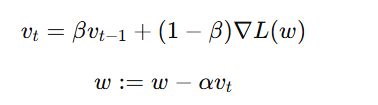

- Effect: Speeds up convergence in valleys and dampens oscillations.
  
- Warning: High momentum + high learning rate → can overshoot the minimum.

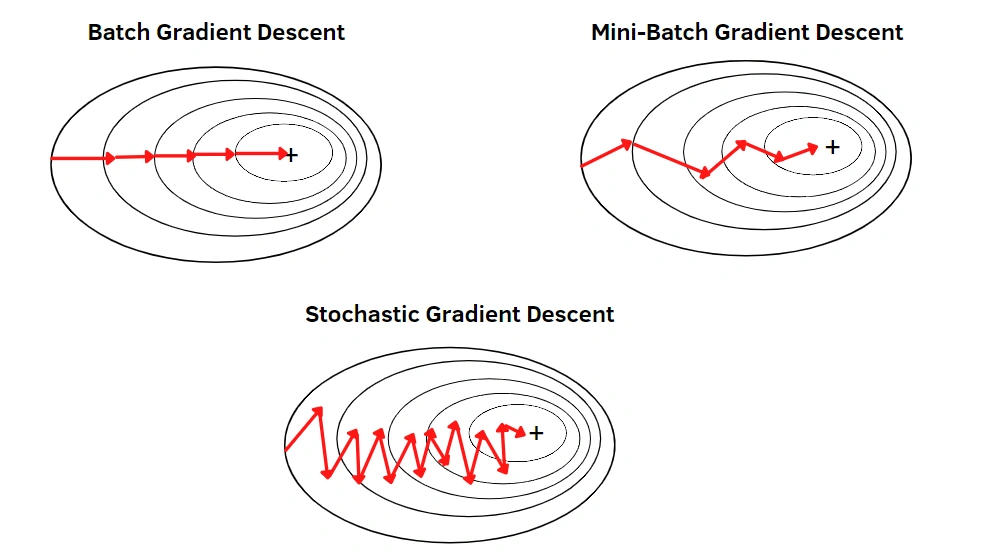

In [57]:
import tensorflow as tf
import numpy as np

# -------------------------------
# 1. Generate synthetic data
# -------------------------------
# 1000 samples, 1 feature each
x_train = np.random.rand(1000, 1)
y_train = 3 * x_train + 2 + 0.1 * np.random.randn(1000, 1)  # y = 3x + 2 + noise

# -------------------------------
# 2. Build the model
# -------------------------------
model = tf.keras.Sequential([
    tf.keras.layers.Dense(1, input_shape=(1,))
])

# -------------------------------
# 3. Compile the model
# -------------------------------
model.compile(
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9),
    loss='mse'
)

# -------------------------------
# 4. Train the model
# -------------------------------
model.fit(x_train, y_train, epochs=10, batch_size=32)


Epoch 1/10


C:\Users\bhagi\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:92: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.4904    
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2819 
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0955 
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0403 
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0218 
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0145 
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0119 
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0109 
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0106 
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0104 


## Explanation

- Import libraries:

    - tensorflow → for building and training the neural network.

    - numpy → for creating synthetic data.

- Generate synthetic data:

    - x_train = np.random.rand(1000, 1) → 1000 random input samples with 1 feature each.

    - y_train = 3 * x_train + 2 + noise → outputs follow a linear relation y = 3x + 2 with small random noise.

- Build the model:

    - Sequential → stack layers linearly.

    - Dense(1, input_shape=(1,)) → single neuron layer, expects 1 input feature, outputs 1 value.

- Compile the model:

    - optimizer=SGD(learning_rate=0.01, momentum=0.9) → Stochastic Gradient Descent with momentum to speed up convergence.

    - loss='mse' → Mean Squared Error, suitable for regression tasks.

- Train the model:

    - model.fit(x_train, y_train, epochs=10, batch_size=32) →

    - epochs=10 → run 10 full passes over the dataset.

    - batch_size=32 → update weights after every 32 samples.

    - TensorFlow adjusts weights to minimize the MSE between predicted and true y_train.

---

## 2. Adam (Adaptive Moment Estimation)

Adam combines the advantages of two other extensions of SGD: AdaGrad and RMSProp.

It computes adaptive learning rates for each parameter by considering both first and second moments of the gradients. Adam is one of the most popular optimizers due to its efficient handling of sparse gradients and non-stationary objectives.

> tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-07)
>

- Combines momentum + RMSProp ideas.
  
- Maintains:
    1. First moment (mean) → like momentum.
    2. Second moment (variance) → like RMSProp.
       
- **Formulas**:

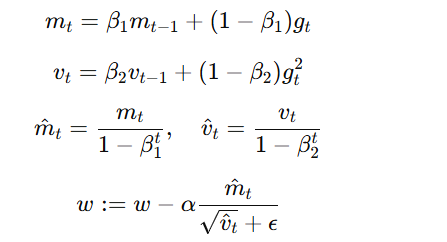

- Pros: Fast convergence, robust, widely used.

- Cons: Can overfit if not regularized; not always better than SGD in generalization.

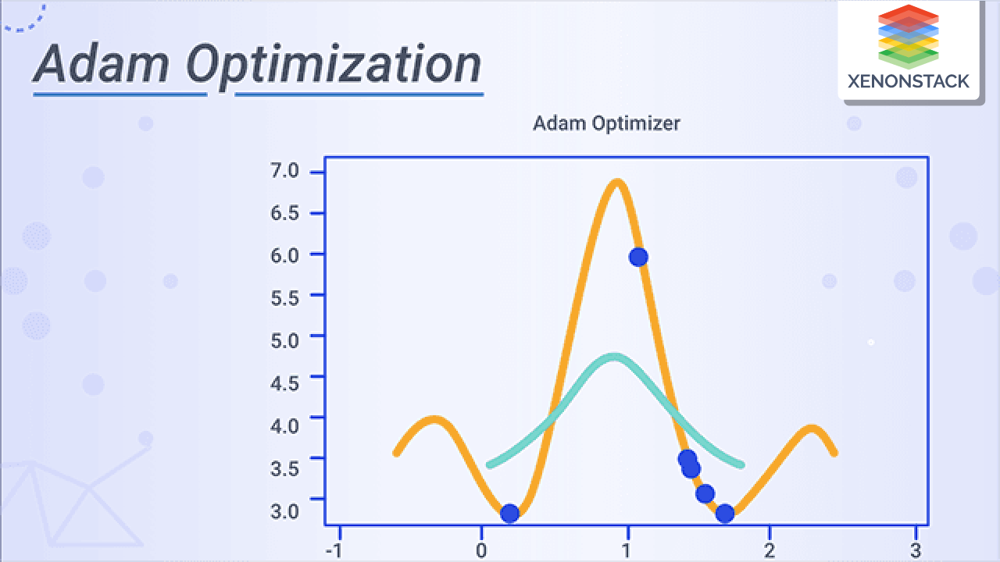

In [58]:
import tensorflow as tf
import numpy as np

# -------------------------------
# 1. Generate synthetic data
# -------------------------------
# 1000 samples, 1 feature each
x_train = np.random.rand(1000, 1)
y_train = 3 * x_train + 2 + 0.1 * np.random.randn(1000, 1)  # y = 3x + 2 + noise

# -------------------------------
# 2. Build the model
# -------------------------------
model = tf.keras.Sequential([
    tf.keras.layers.Dense(1, input_shape=(1,))
])

# -------------------------------
# 3. Compile the model with Adam
# -------------------------------
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='mse'
)

# -------------------------------
# 4. Train the model
# -------------------------------
model.fit(x_train, y_train, epochs=10, batch_size=32)


Epoch 1/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 6.9434   
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.6916 
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.4471 
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.2098 
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.9779 
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.7532 
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.5357 
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.3236 
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.1181 
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 4.9188 


## Explanation

- Import libraries:

    - tensorflow → for creating and training the neural network.

    - numpy → for generating synthetic input/output data.

- Generate synthetic data:

    - x_train = np.random.rand(1000, 1) → 1000 input samples, each with 1 feature.

    - y_train = 3 * x_train + 2 + noise → outputs follow a linear relation y = 3x + 2 plus small Gaussian noise.

- Build the model:

    - Sequential → defines a simple stack of layers.

    - Dense(1, input_shape=(1,)) → a single neuron layer, taking 1 input feature and producing 1 output.

- Compile the model:

    - optimizer=Adam(learning_rate=0.001) → uses Adam optimizer for faster convergence and adaptive learning rates.

    - loss='mse' → Mean Squared Error, suitable for regression.

- Train the model:

    - model.fit(x_train, y_train, epochs=10, batch_size=32) →

        - Runs 10 epochs (full passes over the dataset).

        - Updates weights every 32 samples (mini-batch).

- The network learns to approximate y = 3x + 2 by minimizing MSE.

---


## 3. RMSprop (Root Mean Square Propagation)

RMSprop is an adaptive learning rate method, that divides the learning rate by an exponentially decaying average of squared gradients. This optimizer is effective for handling non-stationary objectives and is often used for training RNNs.

`*tf.keras.optimizers.RMSprop(learning_rate=0.001, rho=0.9, epsilon=1e-07)*`

**Formula**

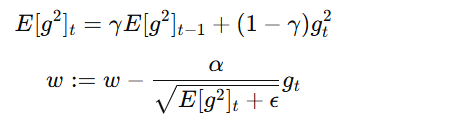

- Pros: Works well with mini-batches, faster convergence.

- Cons: Learning rate still needs tuning.

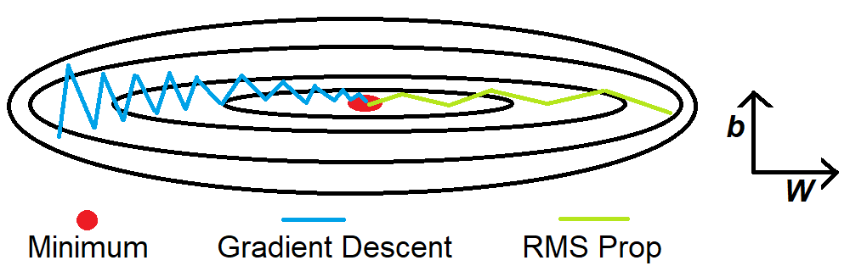

In [59]:
import tensorflow as tf
model = tf.keras.Sequential([tf.keras.layers.Dense(1)])

# Compile the model with RMSprop optimizer
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.001), loss='mse')
model.fit(x_train, y_train)

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 8.7643   


---

## 4. Learning rate scheduling

The learning rate (LR) is the most sensitive hyperparameter in training deep CNNs. Too high → divergence, too low → slow training. Schedulers adjust LR during training.

### Common Strategies

1. Step Decay: Reduce LR by a factor every N epochs.

2. Exponential Decay: Multiply LR by factor < 1 after every epoch.

3. 1Cycle Policy / Cosine Annealing: LR rises initially then decays → better convergence.

4. ReduceLROnPlateau: LR reduces if validation loss stops improving.

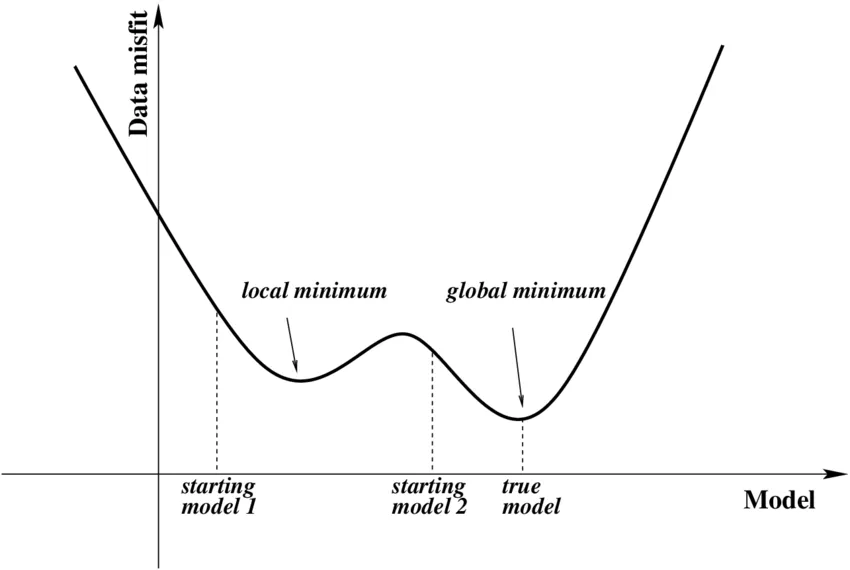

In [60]:
# -----------------------------
# 1. Import Libraries
# -----------------------------
import tensorflow as tf
from tensorflow.keras.datasets import mnist
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.utils import to_categorical
import math

# -----------------------------
# 2. Load Dataset
# -----------------------------
(x_train, y_train), (x_test, y_test) = mnist.load_data()

# Normalize and reshape
x_train = x_train.reshape(x_train.shape[0], 28, 28, 1).astype('float32') / 255.0
x_test  = x_test.reshape(x_test.shape[0], 28, 28, 1).astype('float32') / 255.0

# Convert labels to categorical
y_train = to_categorical(y_train, num_classes=10)
y_test  = to_categorical(y_test, num_classes=10)

# Split training into train + validation sets
from sklearn.model_selection import train_test_split
x_train, x_val, y_train, y_val = train_test_split(
    x_train, y_train, test_size=0.1, random_state=42
)

# -----------------------------
# 3. Define Learning Rate Scheduler
# -----------------------------
def step_decay(epoch):
    initial_lr = 0.01
    drop = 0.5
    epochs_drop = 5
    lr = initial_lr * (drop ** math.floor(epoch / epochs_drop))
    return lr

lr_scheduler = LearningRateScheduler(step_decay)

# -----------------------------
# 4. Build CNN Model
# -----------------------------
def build_model():
    model = Sequential()
    
    # Convolution + Pooling
    model.add(Conv2D(32, kernel_size=(3,3), activation='relu', input_shape=(28,28,1)))
    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(Dropout(0.25))
    
    # Flatten + Dense layers
    model.add(Flatten())
    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(10, activation='softmax'))
    
    # Compile model
    model.compile(
        loss='categorical_crossentropy',
        optimizer='adam',  # initial optimizer, LR controlled by scheduler
        metrics=['accuracy']
    )
    return model

model = build_model()

# -----------------------------
# 5. Train Model with LR Scheduler
# -----------------------------
history = model.fit(
    x_train, y_train,
    batch_size=64,
    epochs=5,
    validation_data=(x_val, y_val),
    callbacks=[lr_scheduler],
    verbose=2
)

# -----------------------------
# 6. Evaluate Model
# -----------------------------
test_loss, test_acc = model.evaluate(x_test, y_test, verbose=2)
print(f"\nTest Accuracy: {test_acc:.4f}, Test Loss: {test_loss:.4f}")


C:\Users\bhagi\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
844/844 - 29s - 34ms/step - accuracy: 0.9343 - loss: 0.2199 - val_accuracy: 0.9783 - val_loss: 0.0701 - learning_rate: 0.0100
Epoch 2/5
844/844 - 27s - 32ms/step - accuracy: 0.9582 - loss: 0.1451 - val_accuracy: 0.9823 - val_loss: 0.0585 - learning_rate: 0.0100
Epoch 3/5
844/844 - 27s - 32ms/step - accuracy: 0.9598 - loss: 0.1376 - val_accuracy: 0.9833 - val_loss: 0.0636 - learning_rate: 0.0100
Epoch 4/5
844/844 - 29s - 35ms/step - accuracy: 0.9639 - loss: 0.1280 - val_accuracy: 0.9820 - val_loss: 0.0650 - learning_rate: 0.0100
Epoch 5/5
844/844 - 31s - 37ms/step - accuracy: 0.9654 - loss: 0.1230 - val_accuracy: 0.9827 - val_loss: 0.0589 - learning_rate: 0.0100
313/313 - 2s - 6ms/step - accuracy: 0.9799 - loss: 0.0767

Test Accuracy: 0.9799, Test Loss: 0.0767


## Explanation

### 1. Import Libraries

- TensorFlow/Keras for model building, training, and preprocessing.

- Matplotlib for plotting (optional if you add graphs later).

- Math for learning rate calculations.


### 2. Load and Preprocess MNIST


- Load MNIST dataset: x_train, y_train, x_test, y_test.

- Reshape to (28,28,1) for CNN input.

- Normalize pixel values to [0,1].

- Convert labels to one-hot vectors using to_categorical.

- Split training data into train + validation (90%-10%).


### 3. Learning Rate Scheduler

- step_decay(epoch): reduces learning rate every epochs_drop epochs by multiplying with drop.

- LearningRateScheduler callback applies this during training.


### 4. Build CNN Model (build_model)

- Conv2D + MaxPooling2D → extract features.

- Dropout → prevent overfitting.

- Flatten + Dense layers → fully connected classifier.

- Softmax output for 10 classes.

- Compile with chosen optimizer, categorical_crossentropy loss, and accuracy metric.


### 5. Define Optimizers

- SGD: with learning rate 0.01 and momentum 0.9.

- Adam: with learning rate 0.001.

- RMSProp: with learning rate 0.001.


### 6. Train and Compare

- Loop over all optimizers:
    - Build a new model for each optimizer.
    - Train for 10 epochs with batch size 64.
    - Apply LR scheduler.
    - Evaluate test accuracy after training.

- Store results in a dictionary.

### 7. Print Results

- Display test accuracy for each optimizer.

- Compare speed, convergence, and performance.


💡 Key Points

- SGD: slower but better generalization.

- Adam: faster convergence, less tuning.

- RMSProp: good for noisy gradients.

- LR Scheduler: helps optimizer converge efficiently.

---

## **Key Takeaways**

- Optimizers:
    - SGD → basic, stable, slower.
    - Momentum → faster, smoother updates.
    - Adagrad → adaptive, good for sparse data, decays LR too fast.
    - RMSProp → adapts to gradients, works with mini-batches.
    - Adam → combines RMSProp + momentum, widely recommended.

- Learning rate schedules dramatically impact convergence.

- No optimizer is universally best; dataset type, model depth, and task influence choice.

- Start simple → scale complexity as needed.

## **Comparison Summary**

| Optimizer | Speed | Stability | Best for | Downside |
| --- | --- | --- | --- | --- |
| SGD | Slow | Stable | Simple tasks | Needs tuning, poor at saddle points |
| SGD + Momentum | Faster | Stable | Most tasks | Can overshoot |
| Adagrad | Medium | Adaptive | Sparse data | Learning rate decays too much |
| RMSProp | Fast | Adaptive | Mini-batch training | Needs manual learning rate |
| AdaDelta | Fast | Adaptive | Avoids LR tuning | Less control over LR |
| Adam | Fastest | Adaptive | Most tasks | Can overfit, may generalize worse than SGD |

---

# 4. Transfer learning (fine-tuning pretrained models).

## 1. Introduction 📊

- Transfer Learning is a deep learning technique where a pre-trained model (trained on a large dataset) is reused for a new, related task.

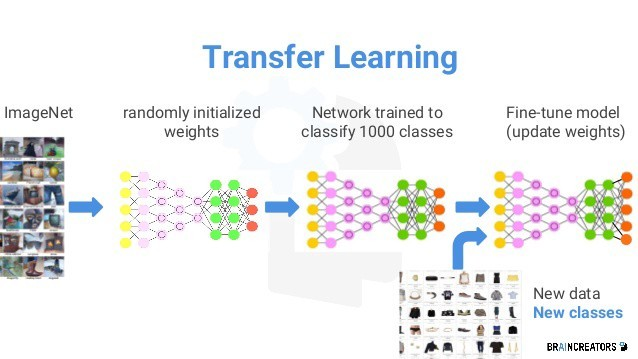

- Fine-Tuning builds on transfer learning by adjusting the pre-trained model's parameters to better fit the new dataset.

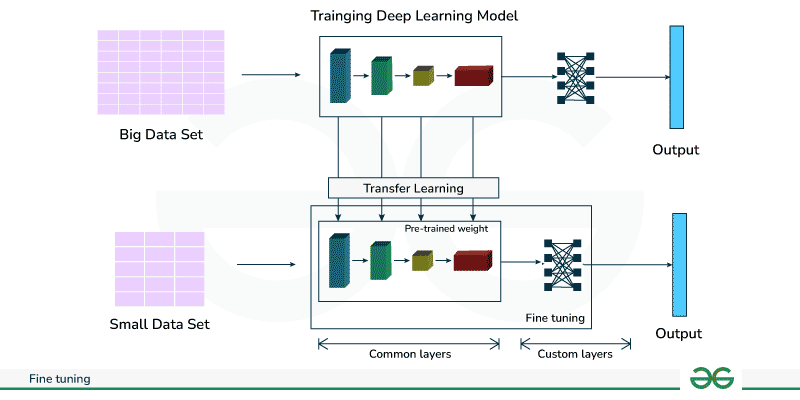

- These approaches are especially useful when:
    - The dataset for the new task is small.
      
    - Training a model from scratch would be computationally expensive.
 
      
    - We want faster convergence with potentially better performance.
    
- ✅ Advantages:
    - Reduces training time.
      
    - Improves performance by leveraging previously learned features.
 
      
    - Useful for tasks where collecting massive amounts of labeled data is difficult.

---

## 2. Why Use Transfer Learning?⚡

1. Limited Data:
    - Deep neural networks need large datasets.
    - Pre-trained models provide knowledge from previously learned tasks.
      
2. Time and Resource Efficiency:
    - Training from scratch is expensive in computation and time.
    - Transfer learning reduces the need for long training cycles.
      
3. Better Performance:
    - Starting from pre-trained weights often results in higher accuracy than random initialization.
    - Pre-trained models have already learned generic features (edges, textures, shapes) that help in new tasks.

---

## 3. Transfer Learning Process 🧩

### A. Feature Extraction

- The pre-trained model acts as a fixed feature extractor.

- Pre-trained weights are frozen, only the final classifier layer is trained for the new task.

- Suitable when you have small datasets and the new task is similar to the original task.

### B. Fine-Tuning

- Some top layers of the pre-trained model are unfrozen.

- Both new classifier layers and selected pre-trained layers are trained together.

- Allows model to adapt the learned features for the specific new dataset.

- Helps improve performance beyond simple feature extraction.

## 🔧 How to fine-tune a model?

Fine-tuning a model typically involves the following steps:

- Load a Pre-trained Model: Use a model that has been pre-trained on a large dataset (e.g., ImageNet for image-related tasks).

- Add Custom Layers: Add new layers to the pre-trained model to suit the specific task.

- Freeze the Pre-trained Layers: Initially freeze the layers of the pre-trained model to prevent them from being updated during the initial training phase.

- Train the Custom Layers: Train the newly added layers on the new dataset.

- Unfreeze Some Layers: Unfreeze some or all of the pre-trained layers for fine-tuning.

- Train the Model Again: Retrain the entire model (or the chosen layers) with a lower learning rate.

---

## 4. Pre-trained Models in Keras 🐍

Keras provides access to several pre-trained models via keras.applications, including:

- VGG16, VGG19: Classic convolutional architectures, effective for image classification.

- ResNet50: Residual networks, handle very deep models efficiently.

- InceptionV3: Factorized convolutions, optimized for speed and accuracy.

- MobileNet, EfficientNet: Lightweight models for mobile/edge devices.

These models can be used either as fixed feature extractors or can be fine-tuned for custom tasks.

Displaying all 6 images from dataset:


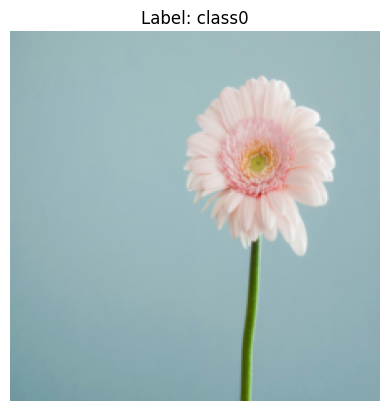

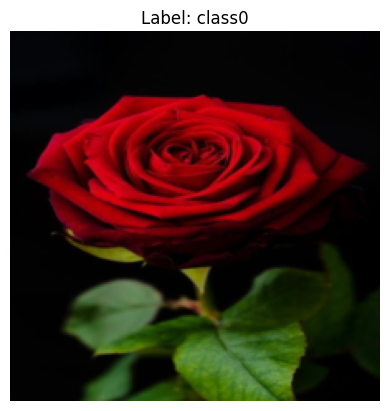

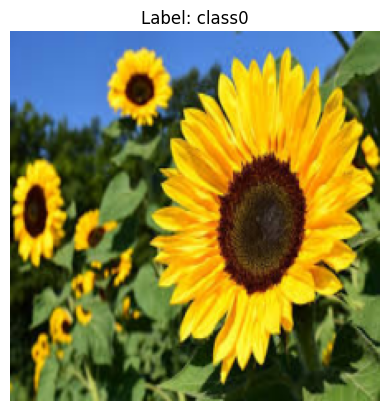

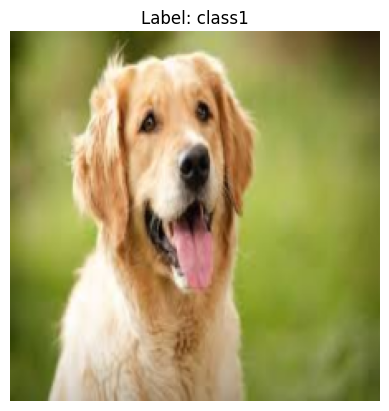

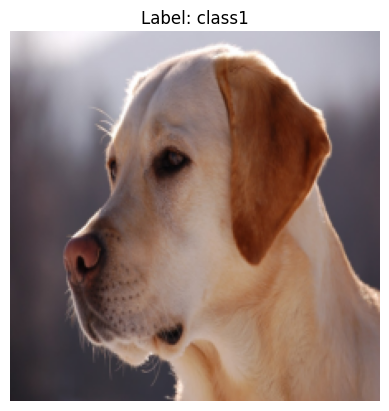

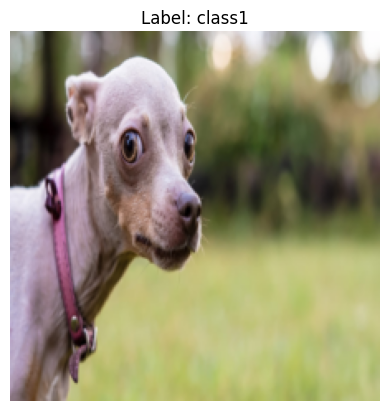

Epoch [1/3], Loss: 0.8671
Epoch [2/3], Loss: 0.7613
Epoch [3/3], Loss: 0.5631
Fine-tuning complete! The model's final layer has been trained for your images.


In [61]:
# 1️⃣ Load Pretrained Model
model = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)

# Freeze all layers except the final fully connected layer
for param in model.parameters():
    param.requires_grad = False

# Replace the final layer for 2-class classification
model.fc = nn.Linear(model.fc.in_features, 2)


# 2️⃣ Prepare Dataset from Folder
# Transform: resize, convert to tensor, normalize
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Folder structure:
# images/
#    class0/
#       img1.png
#       img2.png
#       img3.png
#    class1/
#       img4.png
#       img5.png
#       img6.png

data_dir = "images"  # Replace with your folder path
train_dataset = datasets.ImageFolder(root=data_dir, transform=transform)
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)


# 3️⃣ Display All Images
print(f"Displaying all {len(train_dataset)} images from dataset:")
for i in range(len(train_dataset)):
    img, label = train_dataset[i]
    img = img.permute(1, 2, 0)  # C,H,W -> H,W,C (Channels (3 for RGB: Red, Green, Blue)), Height(pixel), Width(pixel))
    # Unnormalize for display
    img = img * torch.tensor([0.229, 0.224, 0.225]) + torch.tensor([0.485, 0.456, 0.406])
    img = torch.clamp(img, 0, 1)
    plt.imshow(img)
    plt.title(f"Label: {train_dataset.classes[label]}")
    plt.axis('off')
    plt.show()

# 4️⃣ Loss and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.fc.parameters(), lr=0.001, momentum=0.9)


# 5️⃣ Training Loop

num_epochs = 3
for epoch in range(num_epochs):
    for images, labels in train_loader:
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}")


# 6️⃣ Model Ready
print("Fine-tuning complete! The model's final layer has been trained for your images.")

## Explanation

- Pretrained Model: Loads ResNet-18 pretrained on ImageNet.

- Freeze Layers: All layers frozen except the final fully connected (fc) layer.

- Modify Output: Replaces final fc layer with a new layer for 2-class classification.

- Dataset Loading:

    - Uses ImageFolder to load images from folders.

    - Applies transformations: resize to 224×224, convert to tensor, normalize with ImageNet stats.

- DataLoader:

    - Batches of 4 images.

    - Shuffles data for training.

- Visualization:

    - Displays all images with labels.

    - Unnormalizes images for proper display.

- Loss & Optimizer:

    - Uses CrossEntropyLoss.

    - Optimizer: SGD with momentum.

    - Only final layer parameters are updated.

- Training Loop (3 epochs):

    - Zero gradients.

    - Forward pass to compute outputs.

    - Compute loss.

    - Backward pass for gradients.

    - Update weights of final layer.

- Inference Ready: After training, the model can be used on new images.

- Efficiency: Fine-tunes on a small dataset quickly by leveraging pretrained features, reducing overfitting and improving convergence.

---

# 5. Handling class imbalance.

## 1. What is Class Imbalance?

- Definition: A dataset is imbalanced when one class (majority) heavily outweighs the other(s) (minority).
  
- Example: Fraud detection → 99% transactions are legit, 1% are fraudulent.

### Why it’s a problem?

- Biased learning: Classifier just predicts majority class to get "high accuracy."

- Misleading metrics: 99% accuracy looks good but fraud (the minority) is ignored.

- Minority as noise: Model often treats rare cases as outliers instead of important signals.

---

## 2. Why Accuracy Alone Fails

- Accuracy = (TP + TN) / (Total)

- In skewed datasets, accuracy inflates because predicting only the majority still gives high scores.

✅ Better metrics:

- Precision: How many predicted positives are actually positive?

- Recall (Sensitivity): How many actual positives did we catch?

- F1-Score: Harmonic mean of Precision & Recall.

- ROC-AUC / PR-AUC: More robust when imbalance is severe.

**Formula reminder:**


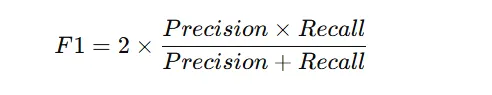




## 3. Techniques to Handle Imbalanced Data

### (A) **Data-Level Approaches**

These modify the training data distribution.

1. **Undersampling (reduce majority class)**
    
    - Randomly remove samples from majority class until balanced.
    
    - ✅ Pros: Reduces training time, balance achieved.
    
    - ❌ Cons: May throw away valuable information, risk underfitting.
  
      
2. **Oversampling (increase minority class)**
    
    - Duplicate or sample minority instances with replacement.
    
    - ✅ Pros: No info loss, balances classes.
    
    - ❌ Cons: Risk of overfitting (same samples repeated).
  
      
3. **SMOTE (Synthetic Minority Oversampling Technique)**
    
    - Generates synthetic new minority examples by interpolating between neighbors.
    
    - ✅ Pros: More diverse data than plain oversampling.
    
    - ❌ Cons: Can create noisy/infeasible samples, struggles with high-dimensional data.
  
      
4. **ADASYN (Adaptive Synthetic Sampling)**
    
    - Like SMOTE, but creates more synthetic data in areas where minority class is harder to learn.
    
    - ✅ Pros: Focuses on difficult-to-classify regions.
    
    - ❌ Cons: May reinforce noise/outliers.
  
---

### (B) Algorithm-Level Approaches

Modify algorithms or training process instead of dataset.

1. Class Weights / Cost-Sensitive Learning
    - Assign higher penalty (loss weight) for misclassifying minority class.
    - Available in: LogisticRegression(class_weight='balanced'), RandomForestClassifier(class_weight='balanced'), neural nets (custom loss).
    - ✅ Pros: Keeps dataset intact.
    - ❌ Cons: May overcompensate if weights are not tuned well.
2. Threshold Moving
    - Adjust default decision threshold (e.g., from 0.5 → 0.3) to favor minority detection.
    - Use ROC/PR curves to choose best threshold.
    - ✅ Pros: Easy, no data changes.
    - ❌ Cons: Doesn’t fix class imbalance itself, just shifts prediction bias.
3. Tree-Based Models
    - Decision Trees, Random Forests, XGBoost, LightGBM handle imbalance better.
    - Most have built-in parameters like scale_pos_weight.
    - ✅ Pros: Naturally robust to imbalance.
    - ❌ Cons: Still need tuning for extreme imbalance.
4. Balanced Bagging / Boosting
    - Example: BalancedBaggingClassifier (Imbalanced-learn library).
    - Performs resampling internally during bagging/boosting.
    - ✅ Pros: Combines resampling + ensemble power.
    - ❌ Cons: Slower training, more complex.

---

### (C) Alternative Approaches

1. Anomaly Detection
    
    - Treat minority class as outliers/anomalies.
    
    - Algorithms: One-Class SVM, Isolation Forest, LOF.
    
    - ✅ Pros: Works when minority is extremely rare (<1%).
    
    - ❌ Cons: Less effective if minority has complex structure.

2. Hybrid Methods
    
    - Combine resampling + cost-sensitive learning.
    
    - Example: SMOTE + Random Forest with class weights.
    
    - Often best in practice.

---

## 4. Choosing the Right Strategy

| Situation | Best Strategy |
| --- | --- |
| Mild imbalance (e.g., 60-40) | Use weighted loss or tree models |
| Severe imbalance (e.g., 95-5) | SMOTE/ADASYN + cost-sensitive learning |
| Extreme imbalance (e.g., 99-1, fraud/rare disease) | Anomaly detection, threshold moving, ensemble methods |
| Small dataset | Oversampling (SMOTE) |
| Large dataset | Undersampling or weighted learning |

---

## 5. Workflow to Handle Imbalance

1. Check class distribution (Counter(y) or value_counts()).

2. Pick evaluation metric (F1, ROC-AUC, PR-AUC).

3. Baseline model (with no balancing).

4. Apply techniques (resampling, class weights, etc.).

5. Tune threshold for best trade-off.

6. Validate results with metrics suitable for imbalance.

In [62]:
import numpy as np
from collections import Counter
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, f1_score, precision_score, recall_score, roc_auc_score
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.ensemble import BalancedBaggingClassifier


## Explanation

- numpy → for numerical operations

- Counter → counts the number of samples per class

- make_classification → generates a synthetic dataset for testing

- train_test_split → splits data into training/testing sets

- RandomForestClassifier → tree-based model used here as the classifier

- Metrics → F1-score, precision, recall, ROC-AUC (better than accuracy for imbalanced data)

- imblearn → handles class imbalance:

    - RandomOverSampler → duplicates minority class

    - RandomUnderSampler → removes majority class

    - SMOTE → generates synthetic minority samples

    - BalancedBaggingClassifier → ensemble that internally balances classes

In [63]:
X, y = make_classification(
    n_classes=2,
    class_sep=2,
    weights=[0.1, 0.9],   # 10% minority, 90% majority
    n_informative=3,
    n_redundant=1,
    n_features=20,
    n_samples=1000,
    random_state=42
)


- Creates 1000 samples, 20 features each.

- Imbalanced classes: class 0 → 10%, class 1 → 90%.

- class_sep=2 → separates classes clearly in feature space (good for testing).

- n_informative & n_redundant → control how many features are useful/redundant.

In [64]:
print("Original class distribution:", Counter(y))


Original class distribution: Counter({np.int64(1): 893, np.int64(0): 107})


- Prints how many samples are in each class, e.g., Counter({1: 893, 0: 107}).

In [65]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)


- 80% training, 20% testing

- Ensures that models are trained on one set and evaluated on unseen data for proper validation.

In [66]:
oversample = RandomOverSampler(sampling_strategy='minority', random_state=42)
X_over, y_over = oversample.fit_resample(X_train, y_train)


- Duplicates minority class samples to match majority class count.

- Counter(y_over) → now classes are balanced.

In [67]:
undersample = RandomUnderSampler(sampling_strategy='majority', random_state=42)
X_under, y_under = undersample.fit_resample(X_train, y_train)


- Removes majority class samples to match minority class count.

- Helps model focus equally on minority class, but may lose information.

In [68]:
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_smote, y_smote = smote.fit_resample(X_train, y_train)


- Creates new synthetic samples for minority class.

- More advanced than simple oversampling because it adds variation rather than duplicates.

In [69]:
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)


- Trains a standard random forest without handling imbalance explicitly.

- This usually biases toward the majority class.

In [70]:
rf_smote = RandomForestClassifier(random_state=42)
rf_smote.fit(X_smote, y_smote)
y_pred_smote = rf_smote.predict(X_test)


- Trains the same model on balanced SMOTE data.

- Should perform better on the minority class (higher recall/F1).

In [71]:
bbc = BalancedBaggingClassifier(
    estimator=RandomForestClassifier(random_state=42),
    sampling_strategy='auto',
    replacement=False,
    random_state=42
)
bbc.fit(X_train, y_train)
y_pred_bbc = bbc.predict(X_test)


- Ensemble method

- Internally balances the classes during training

- Reduces bias toward the majority class

- Often more robust than simple resampling

In [72]:
# --------------------------
# 5️⃣ Evaluation Function
# --------------------------
def evaluate_model(y_true, y_pred, name="Model"):
    print(f"\n===== {name} Evaluation =====")
    print("Class Distribution in Test Set:", Counter(y_true))
    print("Classification Report:\n", classification_report(y_true, y_pred))
    print("F1 Score:", f1_score(y_true, y_pred))
    print("Precision:", precision_score(y_true, y_pred))
    print("Recall:", recall_score(y_true, y_pred))
    print("ROC-AUC:", roc_auc_score(y_true, y_pred))

# Evaluate all models
evaluate_model(y_test, y_pred_rf, "Random Forest (Original)")
evaluate_model(y_test, y_pred_smote, "Random Forest (SMOTE)")
evaluate_model(y_test, y_pred_bbc, "Balanced Bagging Classifier")

# --------------------------
# 6️⃣ Threshold Tuning Example
# --------------------------
y_proba = rf.predict_proba(X_test)[:, 1]
threshold = 0.3  # adjust threshold to favor minority class
y_pred_thresh = (y_proba >= threshold).astype(int)
evaluate_model(y_test, y_pred_thresh, f"RF with Threshold {threshold}")


===== Random Forest (Original) Evaluation =====
Class Distribution in Test Set: Counter({np.int64(1): 182, np.int64(0): 18})
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.83      0.91        18
           1       0.98      1.00      0.99       182

    accuracy                           0.98       200
   macro avg       0.99      0.92      0.95       200
weighted avg       0.99      0.98      0.98       200

F1 Score: 0.9918256130790191
Precision: 0.9837837837837838
Recall: 1.0
ROC-AUC: 0.9166666666666667

===== Random Forest (SMOTE) Evaluation =====
Class Distribution in Test Set: Counter({np.int64(1): 182, np.int64(0): 18})
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.83      0.91        18
           1       0.98      1.00      0.99       182

    accuracy                           0.98       200
   macro avg       0.99      0.92      0.95       200
weigh

- Prints a full report for each model:

    - F1 score → balances precision & recall (key for imbalance)

    - Precision → correctness of minority predictions

    - Recall → how many minority samples were captured

    - ROC-AUC → overall ability to separate classes
 
- Normally, models classify probability ≥ 0.5 as class 1.

- By lowering threshold to 0.3, we favor the minority class, improving recall/F1.

- Useful when catching minority class is more important than majority class accuracy.